In [1]:
%cd ../..

/mnt/batch/tasks/shared/LS_root/mounts/clusters/jeffrey-uso9-03-dev-ci01/code/Users/jeffrey.tackes/ModernTS_2E


In [2]:
import os
import shutil
import json

import joblib
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path

from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed(42)
tqdm.pandas()

from statsforecast import StatsForecast
from neuralforecast import NeuralForecast
from neuralforecast.models import NLinear
from neuralforecast.auto import AutoNLinear
from neuralforecast.losses.pytorch import MQLoss
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse, mae, mse, mase
from neuralforecast.losses.pytorch import MSE, MAE
from functools import partial

from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch


import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

/tmp/ipykernel_793157/4000670462.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2024-08-17 16:41:55,945	WARNING __init__.py:21 -- Package pickle5 becomes unnecessary in Python 3.8 and above. Its presence may confuse libraries including Ray. Please uninstall the package.
/anaconda/envs/demand_planning/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [3]:
TRAIN_SUBSAMPLE = True  # Trains a subsample of IDs to improve run speed
RETUNE = True  # if false, will use pre-trained hyperparameters when generating the AUTO NeuralForecast

In [4]:
preprocessed = Path("data/london_smart_meters/preprocessed")
output = Path("data/london_smart_meters/output")
try:
    #Reading the missing value imputed and train test split data
    train_df = pd.read_parquet(preprocessed/"selected_blocks_train_missing_imputed_feature_engg.parquet")
    # Read in the Validation dataset as test_df so that we predict on it
    test_df = pd.read_parquet(preprocessed/"selected_blocks_val_missing_imputed_feature_engg.parquet")
    # test_df = pd.read_parquet(preprocessed/"selected_blocks_test_missing_imputed_feature_engg.parquet")
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. Please make sure you have run 01-Feature Engineering.ipynb in Chapter06
    </div>
    """))

In [5]:
train_df.head(2)

,timestamp,LCLid,energy_consumption,frequency,series_length,stdorToU,Acorn,Acorn_grouped,file,holidays,...,timestamp_Minute_sin_1,timestamp_Minute_sin_2,timestamp_Minute_sin_3,timestamp_Minute_sin_4,timestamp_Minute_sin_5,timestamp_Minute_cos_1,timestamp_Minute_cos_2,timestamp_Minute_cos_3,timestamp_Minute_cos_4,timestamp_Minute_cos_5
0,2012-01-01 00:00:00,MAC000061,0.114,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,1.0,1.0,1.0
1,2012-01-01 00:30:00,MAC000061,0.113,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,5.665539e-16,-1.133108e-15,2.143751e-15,-2.266215e-15,6.123234e-16,-1.0,1.0,-1.0,1.0,-1.0


In [6]:
print("Total # of IDs Pre-Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Pre-Sampling:  150


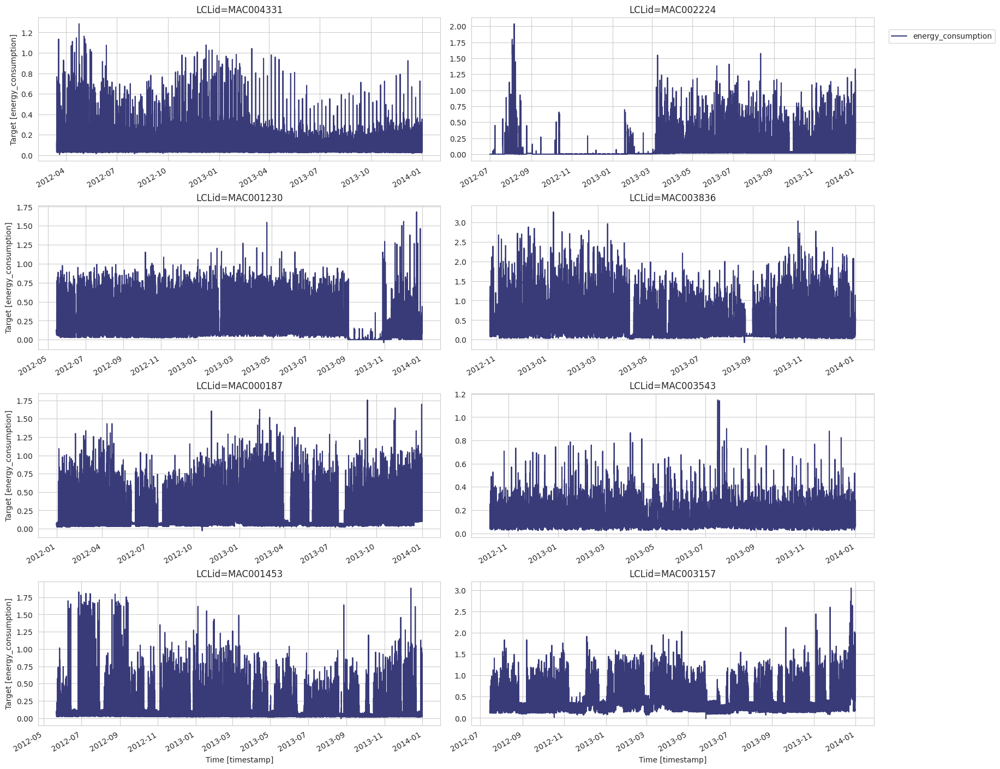

In [7]:
StatsForecast.plot(train_df, engine='matplotlib', id_col='LCLid',time_col= 'timestamp', target_col='energy_consumption')

In [8]:
# To run on smaller set of data for daster iteration.
if TRAIN_SUBSAMPLE:
    print("sub sampling")
    SAMPLE = 10
    sampled_LCLids = pd.Series(train_df.LCLid.unique().remove_unused_categories().categories).sample(SAMPLE, random_state=99).tolist()
    train_df = train_df.loc[train_df.LCLid.isin(sampled_LCLids)]
    test_df = test_df.loc[test_df.LCLid.isin(sampled_LCLids)]

sub sampling


In [9]:
print("Total # of IDs Post Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Post Sampling:  10


## Train, Validation, Test Set

In [10]:
print("Training Min Date: ", train_df.timestamp.min(), 
      "\nTraining Max Date: ", train_df.timestamp.max(), 
      "\nTesting Min Date: ", test_df.timestamp.min(),
      "\nTesting Max Date: ", test_df.timestamp.max()
)

Training Min Date:  2012-01-01 00:00:00 
Training Max Date:  2013-12-31 23:30:00 
Testing Min Date:  2014-01-01 00:00:00 
Testing Max Date:  2014-01-31 23:30:00


In [11]:
#Keeping 1 days aside as a validation set
cutoff = train_df.timestamp.max() - pd.Timedelta(1, "D")

validation_df = train_df[(train_df.timestamp>cutoff)].reset_index(drop=True) # validation prediction set
training_df = train_df[(train_df.timestamp<=cutoff)].reset_index(drop=True) # training set used for validation set

print(f"Train Max: {training_df.timestamp.max()} \nValidation Min: {validation_df.timestamp.min()} \nValidation Max: {validation_df.timestamp.max()}")
print(f"Validation Horizon: {len(validation_df.timestamp.unique())}")


Train Max: 2013-12-30 23:30:00 
Validation Min: 2013-12-31 00:00:00 
Validation Max: 2013-12-31 23:30:00
Validation Horizon: 48


##### Define Validation model parameters

In [12]:
h = 48
max_steps = 100

## Training NLinear Model

In [13]:
training_df[['LCLid']].nunique()[0]

10

In [14]:
len(training_df['LCLid'].unique())

10

In [16]:
model_untuned = [NLinear (h=h, input_size = 48*7, 
                max_steps = max_steps,)]

model_untuned = NeuralForecast(models=model_untuned, freq='30min')
model_untuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params
-----------------------------------------------
0 | loss         | MAE           | 0     
1 | padder_train | ConstantPad1d | 0     
2 | scaler       | TemporalNorm  | 0     
3 | linear       | Linear        | 16.2 K
-----------------------------------------------
16.2 K    Trainable params
0         Non-trainable params
16.2 K    Total params
0.065     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [17]:
# Get Predictions for validation
pred_df =  model_untuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df.merge(validation_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,NLinear,energy_consumption
0,MAC000126,2013-12-31 00:00:00,0.152128,0.093
1,MAC000126,2013-12-31 00:30:00,0.062590,0.109
2,MAC000126,2013-12-31 01:00:00,0.116139,0.082
3,MAC000126,2013-12-31 01:30:00,0.039135,0.067
4,MAC000126,2013-12-31 02:00:00,-0.003738,0.043


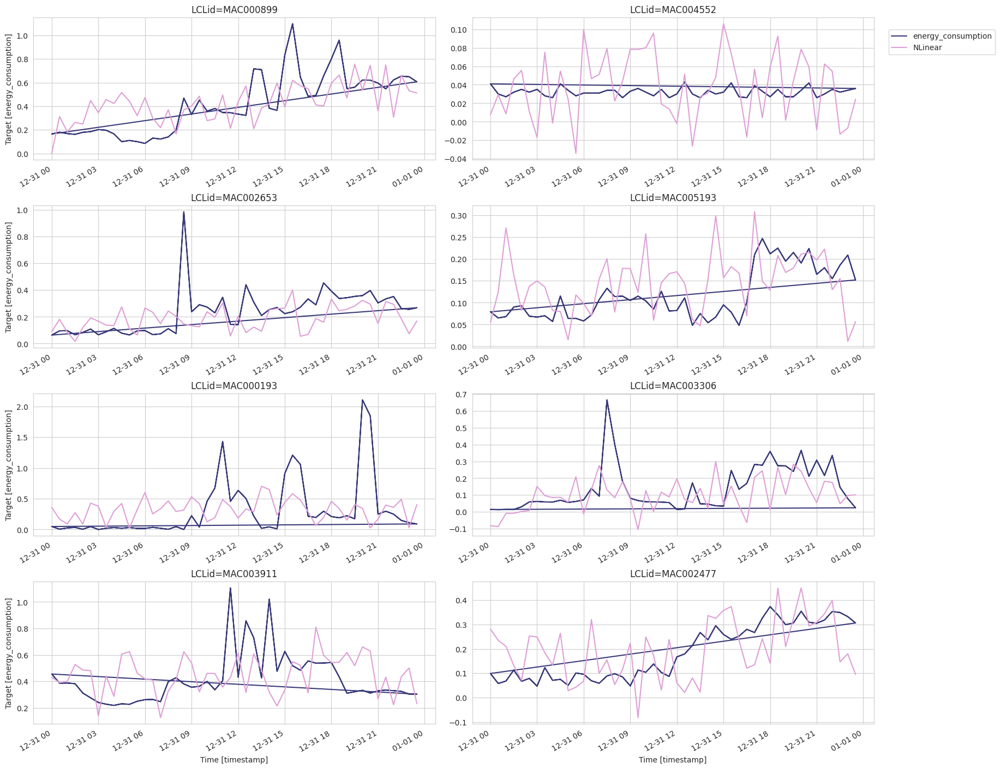

In [18]:
#visualize results
StatsForecast.plot(validation_df[['LCLid','timestamp','energy_consumption']], 
                   pred_df, engine='matplotlib', 
                   id_col='LCLid',
                   time_col= 'timestamp', 
                   target_col='energy_consumption',
                   models=['NLinear'])

#### Evaluate NLinear forecast

In [19]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
NLinear_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
NLinear_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [20]:
NLinear_metrics_agg

,metric,NLinear
0,rmse,0.172303
1,mae,0.128327
2,mse,0.045284
3,mase,1.172702


## NLinear Tuned
Since hyperparameters are key to performance in Neural Networks, NIXTLA has made this search each through the incorporation of Auto forecast.
Each NeuralForecast model has an AUTO class which allow you to easily tune your hyperparameters.

Auto Forecast can time, you can load the pre-trained hyperparameters or choose to retune on your own.
Set ```RETUNE = True``` if you wish to retune.


In [21]:
# Define the file path
config_file_path = 'notebooks/Chapter16/saved_params_config/NLinear_best_config.json'
try:
    with open(config_file_path, 'r') as config_file:
        loaded_config = json.load(config_file)
        print(loaded_config)
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. 
    </div>
    """))
    

In [24]:
NLinear_config = {
    "max_steps": max_steps,  # This parameter can be adjusted if needed
    "input_size": tune.choice([h,h*7,h*7*2,h*7*3]), # Size of input window
    "learning_rate": tune.loguniform(1e-4, 1e-1),  # Initial learning rate
    "scaler_type": tune.choice(["minmax", "standard"]),
    "batch_size": tune.choice([32, 64,128, 256]),
    "random_seed": tune.choice([10, 20,30]),

}

if RETUNE == True:
    models = [AutoNLinear(h=h, 
                     config = NLinear_config,
                     search_alg = HyperOptSearch(),
                     backend = 'ray',
                     num_samples = 100,
                     )]

else:
    models = [AutoNLinear(h=h, 
                    config = loaded_config,
                    search_alg = None,
                    backend = 'ray',
                    #cpus=1
                    )]


model_tuned = NeuralForecast(models=models, freq='30min')
model_tuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption',  val_size = 48)

(_train_tune pid=894730) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_80e5db6a_1_batch_size=256,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_16-55-22/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -------------------------------

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 16:56:31,548	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.63it/s, v_num=0, train_loss_step=0.071, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_72a5111f_2_batch_size=32,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_16-55-27/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.0774, train_loss_epoch=0.0871]


2024-08-17 16:59:12,515	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0774, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_9dec9896_3_batch_size=32,h=48,input_size=672,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_16-56-31/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.601, train_loss_epoch=0.688]


2024-08-17 17:02:57,792	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.601, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_332d67a3_4_batch_size=32,h=48,input_size=336,learning_rate=0.0035,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_16-59-12/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.597, train_loss_epoch=0.625]


2024-08-17 17:06:32,727	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.597, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_cdb7113a_5_batch_size=256,h=48,input_size=1008,learning_rate=0.0038,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-02-57/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.537, train_loss_epoch=0.525]


2024-08-17 17:10:37,845	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.537, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_5e114ab0_6_batch_size=128,h=48,input_size=672,learning_rate=0.0936,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-06-32/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.493, train_loss_epoch=0.549]


2024-08-17 17:14:04,334	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.493, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_3fb79473_7_batch_size=64,h=48,input_size=1008,learning_rate=0.0057,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_17-10-37/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.550, train_loss_epoch=0.587]


(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 17:18:02,922	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_1082df4e_8_batch_size=64,h=48,input_size=336,learning_rate=0.0244,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_17-14-04/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

2024-08-17 17:21:16,174	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.102, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_4eda01ef_9_batch_size=256,h=48,input_size=48,learning_rate=0.0117,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_17-18-02/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.57it/s, v_num=0, train_loss_step=1.010, train_loss_epoch=1.140]


2024-08-17 17:24:19,266	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=1.010, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a5a40832_10_batch_size=64,h=48,input_size=336,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-21-16/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.720, train_loss_epoch=0.752]


2024-08-17 17:27:50,781	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.720, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a5216116_11_batch_size=32,h=48,input_size=672,learning_rate=0.0217,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_17-24-19/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.66it/s, v_num=0, train_loss_step=0.0998, train_loss_epoch=0.113]


2024-08-17 17:31:03,024	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.0998, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_8103a39c_12_batch_size=64,h=48,input_size=672,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-27-50/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.56it/s, v_num=0, train_loss_step=0.578, train_loss_epoch=0.687]


2024-08-17 17:34:34,491	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.578, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_75226639_13_batch_size=32,h=48,input_size=336,learning_rate=0.0639,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-31-03/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.159, train_loss_epoch=0.169]


2024-08-17 17:37:41,720	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.159, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_3b95653b_14_batch_size=32,h=48,input_size=336,learning_rate=0.0079,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_17-34-34/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.601, train_loss_epoch=0.628]


2024-08-17 17:41:04,463	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.601, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_f6fc0eae_15_batch_size=256,h=48,input_size=672,learning_rate=0.0295,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-37-41/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.958, train_loss_epoch=1.110]


2024-08-17 17:44:18,194	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.958, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_aa44d163_16_batch_size=128,h=48,input_size=672,learning_rate=0.0117,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_17-41-04/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.0806, train_loss_epoch=0.0895]


2024-08-17 17:47:22,118	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0806, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_5ab624d5_17_batch_size=128,h=48,input_size=48,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_17-44-18/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=1.260, train_loss_epoch=1.100]


2024-08-17 17:50:31,536	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.260, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_320124d0_18_batch_size=64,h=48,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_17-47-22/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0812, train_loss_epoch=0.0828]


2024-08-17 17:54:04,378	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.0812, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_6feaa8ee_19_batch_size=32,h=48,input_size=48,learning_rate=0.0038,loss=ref_ph_de895953,max_steps=100,random_seed=30,sc_2024-08-17_17-50-31/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=1.070, train_loss_epoch=0.913]


2024-08-17 17:57:15,741	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=1.070, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_d94a6143_20_batch_size=32,h=48,input_size=1008,learning_rate=0.0037,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_17-54-04/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.75it/s, v_num=0, train_loss_step=0.0653, train_loss_epoch=0.0644]


2024-08-17 18:00:58,966	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.0653, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a7436186_21_batch_size=128,h=48,input_size=336,learning_rate=0.0098,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_17-57-15/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.52it/s, v_num=0, train_loss_step=0.0945, train_loss_epoch=0.0878]


2024-08-17 18:04:00,568	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0945, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_542e4fcb_22_batch_size=128,h=48,input_size=336,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_18-00-59/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.145, train_loss_epoch=0.117]


2024-08-17 18:07:22,215	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.145, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_ec0c2a8d_23_batch_size=128,h=48,input_size=336,learning_rate=0.0470,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-04-00/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.125, train_loss_epoch=0.123]


2024-08-17 18:10:40,026	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.125, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_40878a0a_24_batch_size=128,h=48,input_size=48,learning_rate=0.0142,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_18-07-22/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:13:41,873	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.52it/s, v_num=0, train_loss_step=0.239, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a695013e_25_batch_size=128,h=48,input_size=336,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-10-40/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.0984, train_loss_epoch=0.0915]


2024-08-17 18:16:44,014	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0984, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_92a3ff12_26_batch_size=128,h=48,input_size=672,learning_rate=0.0093,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-13-41/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:20:00,674	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.076, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_120fe016_27_batch_size=128,h=48,input_size=336,learning_rate=0.0378,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-16-44/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.119, train_loss_epoch=0.112]


2024-08-17 18:23:07,583	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.36it/s, v_num=0, train_loss_step=0.119, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_82249cb2_28_batch_size=128,h=48,input_size=672,learning_rate=0.0022,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-20-00/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:26:24,117	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.0737, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_18355dc8_29_batch_size=128,h=48,input_size=672,learning_rate=0.0986,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-23-07/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.546, train_loss_epoch=0.558]


2024-08-17 18:29:36,370	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.546, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_08bbe17e_30_batch_size=128,h=48,input_size=672,learning_rate=0.0170,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-26-24/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0868, train_loss_epoch=0.101]


2024-08-17 18:33:06,192	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0868, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_607ee1b8_31_batch_size=128,h=48,input_size=672,learning_rate=0.0081,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_18-29-36/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:36:29,766	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0713, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_491d9872_32_batch_size=256,h=48,input_size=672,learning_rate=0.0057,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-33-06/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.66it/s, v_num=0, train_loss_step=0.0736, train_loss_epoch=0.0853]


2024-08-17 18:39:44,388	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.0736, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_13d6c2ef_33_batch_size=128,h=48,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-36-29/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.0772, train_loss_epoch=0.0888]


2024-08-17 18:42:55,104	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.0772, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_44f02013_34_batch_size=256,h=48,input_size=672,learning_rate=0.0020,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-39-44/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.63it/s, v_num=0, train_loss_step=0.0742, train_loss_epoch=0.0857]


2024-08-17 18:46:08,339	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0742, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_923b1c57_35_batch_size=256,h=48,input_size=672,learning_rate=0.0020,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-42-55/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:49:34,553	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0741, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_f1989628_36_batch_size=256,h=48,input_size=672,learning_rate=0.0060,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_18-46-08/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.0702, train_loss_epoch=0.0654]


2024-08-17 18:52:48,873	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.0702, train_loss_epoch=0.0702, valid_loss=0.0889]


(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_cc8a1ea6_37_batch_size=256,h=48,input_size=1008,learning_rate=0.0065,loss=ref_ph_de895953,max_steps=100,random_seed=20_2024-08-17_18-49-34/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.0703, train_loss_epoch=0.0734]


2024-08-17 18:56:26,186	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0703, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_669f0c36_38_batch_size=256,h=48,input_size=672,learning_rate=0.0026,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_18-52-48/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.60it/s, v_num=0, train_loss_step=0.0733, train_loss_epoch=0.0852]


2024-08-17 18:59:42,865	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0733, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_fe7dc33f_39_batch_size=256,h=48,input_size=48,learning_rate=0.0049,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_18-56-26/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.68it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=0.250]


2024-08-17 19:02:49,549	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.50it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_458be7ed_40_batch_size=256,h=48,input_size=672,learning_rate=0.0555,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_18-59-42/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.271, train_loss_epoch=0.286]


2024-08-17 19:05:56,540	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.271, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_eb2a8667_41_batch_size=64,h=48,input_size=1008,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-02-49/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0735, train_loss_epoch=0.0751]


2024-08-17 19:09:26,236	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.0735, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_f3ec977c_42_batch_size=256,h=48,input_size=672,learning_rate=0.0202,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-05-56/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:12:30,459	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.757, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_78101a2a_43_batch_size=64,h=48,input_size=672,learning_rate=0.0751,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-09-26/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.57it/s, v_num=0, train_loss_step=0.311, train_loss_epoch=0.426]


2024-08-17 19:15:23,487	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.311, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_5434a9a0_44_batch_size=256,h=48,input_size=48,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-12-30/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=1.270, train_loss_epoch=1.390]


2024-08-17 19:18:16,274	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=1.270, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_4e73ba8e_45_batch_size=32,h=48,input_size=672,learning_rate=0.0341,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-15-23/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.58it/s, v_num=0, train_loss_step=0.153, train_loss_epoch=0.151]


2024-08-17 19:21:08,273	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.153, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_631e2932_46_batch_size=256,h=48,input_size=1008,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,random_seed=20_2024-08-17_19-18-16/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.54it/s, v_num=0, train_loss_step=0.071, train_loss_epoch=0.0732]


2024-08-17 19:24:22,298	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.071, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_012b10e6_47_batch_size=64,h=48,input_size=672,learning_rate=0.0141,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_19-21-08/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.65it/s, v_num=0, train_loss_step=0.634, train_loss_epoch=0.574]


2024-08-17 19:27:34,899	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.48it/s, v_num=0, train_loss_step=0.634, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_afbef697_48_batch_size=32,h=48,input_size=672,learning_rate=0.0047,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-24-22/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Sanity Checking DataLoader 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.74it/s]


2024-08-17 19:30:32,669	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.0738, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_71ab06f7_49_batch_size=256,h=48,input_size=48,learning_rate=0.0262,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-27-34/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.72it/s, v_num=0, train_loss_step=0.778, train_loss_epoch=0.828]


2024-08-17 19:33:15,921	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.778, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_4b2db5e2_50_batch_size=32,h=48,input_size=1008,learning_rate=0.0028,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-30-32/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.56it/s, v_num=0, train_loss_step=0.0692, train_loss_epoch=0.0715]


2024-08-17 19:36:35,741	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.0692, train_loss_epoch=0.0692, valid_loss=0.0948

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a99db382_51_batch_size=32,h=48,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_19-33-15/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.69it/s, v_num=0, train_loss_step=0.0779, train_loss_epoch=0.0746]


2024-08-17 19:39:28,156	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.0779, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_c72439c3_52_batch_size=32,h=48,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-36-35/lightning_logs


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 32.3 K    Trainable params
(_train_tune pid=894730) 0         Non-trainable params
(_train_tune pid=894730) 32.3 K    Total params
(_train_tune pid=894730) 0.129     Total estimated model params size (MB)


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.684, train_loss_epoch=0.792]


2024-08-17 19:42:36,347	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.684, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_d113d043_53_batch_size=32,h=48,input_size=48,learning_rate=0.0045,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_19-39-28/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.69it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=0.251]


2024-08-17 19:45:04,494	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_684b26ab_54_batch_size=32,h=48,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-42-36/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.59it/s, v_num=0, train_loss_step=0.0764, train_loss_epoch=0.0881]


2024-08-17 19:48:03,861	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.0764, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_aa8135c4_55_batch_size=32,h=48,input_size=1008,learning_rate=0.0110,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_19-45-04/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.51it/s, v_num=0, train_loss_step=0.641, train_loss_epoch=0.666]


2024-08-17 19:51:50,027	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.39it/s, v_num=0, train_loss_step=0.641, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_c6e7a61f_56_batch_size=32,h=48,input_size=336,learning_rate=0.0079,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_19-48-03/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.70it/s, v_num=0, train_loss_step=0.113, train_loss_epoch=0.0846]


2024-08-17 19:54:39,148	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.113, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_0b0d3d5b_57_batch_size=64,h=48,input_size=672,learning_rate=0.0174,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_19-51-50/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:57:37,592	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.47it/s, v_num=0, train_loss_step=0.0869, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_5d5807c2_58_batch_size=128,h=48,input_size=48,learning_rate=0.0389,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-54-39/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:00:14,282	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.240, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_e3f59ff2_59_batch_size=32,h=48,input_size=672,learning_rate=0.0042,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_19-57-37/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.579, train_loss_epoch=0.663]


2024-08-17 20:03:31,652	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.579, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_83ceb8fb_60_batch_size=128,h=48,input_size=336,learning_rate=0.0016,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-00-14/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:06:11,691	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0977, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_1d0bd544_61_batch_size=32,h=48,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,random_seed=10,s_2024-08-17_20-03-31/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.61it/s, v_num=0, train_loss_step=0.0751, train_loss_epoch=0.0848]


2024-08-17 20:09:02,656	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.0751, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_c802be4b_62_batch_size=128,h=48,input_size=1008,learning_rate=0.0030,loss=ref_ph_de895953,max_steps=100,random_seed=30_2024-08-17_20-06-11/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              | 0/1 [00:00<?, ?it/s]


2024-08-17 20:12:14,939	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0657, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_7b688efe_63_batch_size=64,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-09-02/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.689, train_loss_epoch=0.775]


2024-08-17 20:15:12,996	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.689, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_bf096705_64_batch_size=128,h=48,input_size=336,learning_rate=0.0091,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-12-14/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.63it/s, v_num=0, train_loss_step=0.0944, train_loss_epoch=0.0879]


2024-08-17 20:17:46,521	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.0944, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_1f26e318_65_batch_size=32,h=48,input_size=672,learning_rate=0.0154,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-15-13/lightning_logs


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 32.3 K    Trainable params
(_train_tune pid=894730) 0         Non-trainable params
(_train_tune pid=894730) 32.3 K    Total params
(_train_tune pid=894730) 0.129     Total estimated model params size (MB)


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.086, train_loss_epoch=0.0981]


2024-08-17 20:20:57,762	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.086, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_96fe93a2_66_batch_size=32,h=48,input_size=672,learning_rate=0.0048,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-17-46/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:25:02,517	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.577, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_0b2af7e1_67_batch_size=32,h=48,input_size=672,learning_rate=0.0037,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-20-57/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.576, train_loss_epoch=0.664]


2024-08-17 20:29:12,903	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.31it/s, v_num=0, train_loss_step=0.576, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_68f676de_68_batch_size=32,h=48,input_size=672,learning_rate=0.0075,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-25-02/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.588, train_loss_epoch=0.687]


2024-08-17 20:33:13,684	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.588, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_8db01de0_69_batch_size=32,h=48,input_size=672,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-29-12/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.584, train_loss_epoch=0.670]


2024-08-17 20:37:19,677	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_98ec458b_70_batch_size=32,h=48,input_size=672,learning_rate=0.0112,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-33-13/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.614, train_loss_epoch=0.708]


2024-08-17 20:41:30,298	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.614, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_61d348a0_71_batch_size=32,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-37-19/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.591, train_loss_epoch=0.678]


2024-08-17 20:45:32,624	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.591, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_e17e8b4a_72_batch_size=128,h=48,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-41-30/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.616, train_loss_epoch=0.702]


2024-08-17 20:49:33,470	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.616, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_f1637bca_73_batch_size=32,h=48,input_size=672,learning_rate=0.0069,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_20-45-32/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.582, train_loss_epoch=0.671]


2024-08-17 20:53:36,640	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.582, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_f9e23240_74_batch_size=128,h=48,input_size=672,learning_rate=0.0226,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_20-49-33/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.834, train_loss_epoch=0.978]


2024-08-17 20:57:35,122	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.834, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_61534e5a_75_batch_size=32,h=48,input_size=48,learning_rate=0.0053,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_20-53-37/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.62it/s, v_num=0, train_loss_step=1.010, train_loss_epoch=1.140]


2024-08-17 21:01:19,408	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Validation DataLoader 0: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 50.43it/s]


(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_2e60c8e1_76_batch_size=64,h=48,input_size=672,learning_rate=0.0043,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_20-57-35/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.544, train_loss_epoch=0.502]


2024-08-17 21:05:21,859	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.544, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_af2213c9_77_batch_size=128,h=48,input_size=336,learning_rate=0.0033,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-01-19/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_train_tune pid=894730) --------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=0.0948, train_loss_epoch=0.0879]


2024-08-17 21:08:56,383	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0948, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_fe494412_78_batch_size=32,h=48,input_size=1008,learning_rate=0.0128,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-05-21/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0904, train_loss_epoch=0.0837]


2024-08-17 21:13:07,435	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0904, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_fcf70d3a_79_batch_size=32,h=48,input_size=672,learning_rate=0.0024,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_21-08-56/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.43it/s, v_num=0, train_loss_step=0.582, train_loss_epoch=0.669]


2024-08-17 21:17:05,534	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.582, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_50d9fe58_80_batch_size=128,h=48,input_size=672,learning_rate=0.0299,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-13-07/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.50it/s, v_num=0, train_loss_step=0.142, train_loss_epoch=0.176]


2024-08-17 21:20:57,658	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.142, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_3d3698a2_81_batch_size=32,h=48,input_size=48,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_21-17-05/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.258, train_loss_epoch=0.268]


2024-08-17 21:24:26,642	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.258, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_ce2d822c_82_batch_size=64,h=48,input_size=672,learning_rate=0.0182,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_21-20-57/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.731, train_loss_epoch=0.628]


2024-08-17 21:28:32,248	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.731, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_2a2b058f_83_batch_size=128,h=48,input_size=672,learning_rate=0.0739,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-24-26/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.356, train_loss_epoch=0.423]


2024-08-17 21:32:23,936	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.356, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_10af7477_84_batch_size=32,h=48,input_size=1008,learning_rate=0.0098,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-28-32/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.38it/s, v_num=0, train_loss_step=0.0761, train_loss_epoch=0.0746]


2024-08-17 21:36:42,032	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.29it/s, v_num=0, train_loss_step=0.0761, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_c8fae89c_85_batch_size=32,h=48,input_size=336,learning_rate=0.0039,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_21-32-23/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.717, train_loss_epoch=0.622]


2024-08-17 21:40:34,188	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.717, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_c546e7a9_86_batch_size=128,h=48,input_size=672,learning_rate=0.0062,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-36-42/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              | 0/1 [00:00<?, ?it/s]


2024-08-17 21:44:21,637	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.35it/s, v_num=0, train_loss_step=0.0737, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_48d8b34c_87_batch_size=64,h=48,input_size=672,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,random_seed=30,s_2024-08-17_21-40-34/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.55it/s, v_num=0, train_loss_step=0.072, train_loss_epoch=0.0684]


2024-08-17 21:48:16,309	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.37it/s, v_num=0, train_loss_step=0.072, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_9e583eaa_88_batch_size=32,h=48,input_size=48,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,random_seed=20,sc_2024-08-17_21-44-21/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.45it/s, v_num=0, train_loss_step=1.120, train_loss_epoch=1.250]


2024-08-17 21:52:06,173	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=1.120, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_2e403135_89_batch_size=128,h=48,input_size=672,learning_rate=0.0538,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_21-48-16/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.261, train_loss_epoch=0.299]


2024-08-17 21:56:02,175	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.261, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_8c8086a4_90_batch_size=32,h=48,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-52-06/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 48.4 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.0844, train_loss_epoch=0.0859]


2024-08-17 22:00:24,306	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0844, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_0c417c79_91_batch_size=128,h=48,input_size=336,learning_rate=0.0086,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_21-56-02/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 16.2 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.716, train_loss_epoch=0.624]


2024-08-17 22:04:25,697	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.33it/s, v_num=0, train_loss_step=0.716, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_a19c4b95_92_batch_size=32,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_22-00-24/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:08:10,258	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0783, train_loss_epoch=0

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_463971f5_93_batch_size=256,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_22-04-25/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              | 0/1 [00:00<?, ?it/s]


2024-08-17 22:12:06,860	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.0792, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_3f4351e6_94_batch_size=64,h=48,input_size=48,learning_rate=0.0201,loss=ref_ph_de895953,max_steps=100,random_seed=10,sc_2024-08-17_22-08-10/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 2.4 K 
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.780, train_loss_epoch=0.826]


2024-08-17 22:15:58,446	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.780, train_loss_epoch=0.780, valid_loss=0.0962]


(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_2072e796_95_batch_size=32,h=48,input_size=672,learning_rate=0.0019,loss=ref_ph_de895953,max_steps=100,random_seed=20,s_2024-08-17_22-12-06/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0741, train_loss_epoch=0.0858]


2024-08-17 22:19:49,567	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.33it/s, v_num=0, train_loss_step=0.0741, train_loss_epoch=0.0741, valid_loss=0.0883]


(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_2097f81d_96_batch_size=128,h=48,input_size=672,learning_rate=0.0275,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_22-15-58/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.42it/s, v_num=0, train_loss_step=0.124, train_loss_epoch=0.134]


2024-08-17 22:23:51,417	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.124, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_81152092_97_batch_size=32,h=48,input_size=1008,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_22-19-49/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.560, train_loss_epoch=0.591]


2024-08-17 22:28:19,458	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.560, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 30
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_477ee51f_98_batch_size=128,h=48,input_size=336,learning_rate=0.0056,loss=ref_ph_de895953,max_steps=100,random_seed=30,_2024-08-17_22-23-51/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:31:55,935	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.113, train_loss_epoch=

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=894730) Seed set to 20
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_ff846eb6_99_batch_size=256,h=48,input_size=672,learning_rate=0.0411,loss=ref_ph_de895953,max_steps=100,random_seed=20,_2024-08-17_22-28-19/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=894730) 3 | linear       | Linear        | 32.3 K
(_tra

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.41it/s, v_num=0, train_loss_step=0.220, train_loss_epoch=0.239]


2024-08-17 22:35:49,948	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.30it/s, v_num=0, train_loss_step=0.220, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=894730) Seed set to 10
(_train_tune pid=894730) GPU available: False, used: False
(_train_tune pid=894730) TPU available: False, using: 0 TPU cores
(_train_tune pid=894730) IPU available: False, using: 0 IPUs
(_train_tune pid=894730) HPU available: False, using: 0 HPUs
(_train_tune pid=894730) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-55-22/_train_tune_0f8551b0_100_batch_size=32,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,random_seed=10,_2024-08-17_22-31-55/lightning_logs
(_train_tune pid=894730) 
(_train_tune pid=894730)   | Name         | Type          | Params
(_train_tune pid=894730) -----------------------------------------------
(_train_tune pid=894730) 0 | loss         | MAE           | 0     
(_train_tune pid=894730) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=894730) 2 | scaler       | TemporalNorm  | 0     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:39:54,976	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=894730) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.34it/s, v_num=0, train_loss_step=0.619, train_loss_epoch

(_train_tune pid=894730) `Trainer.fit` stopped: `max_steps=100` reached.
Seed set to 20
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params
-----------------------------------------------
0 | loss         | MAE           | 0     
1 | padder_train | ConstantPad1d | 0     
2 | scaler       | TemporalNorm  | 0     
3 | linear       | Linear        | 32.3 K
-----------------------------------------------
32.3 K    Trainable params
0         Non-trainable params
32.3 K    Total params
0.129     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


The results of the tuning can then be viewed by running the below.

In [25]:
NLinear_best_config = model_tuned.models[0].results.get_best_result().config

# Remove specific keys using the pop method and then saving so we can extract parameters later
NLinear_best_config.pop("loss", None)
NLinear_best_config.pop("valid_loss", None)
NLinear_best_config.pop("h", None)

# Save the filtered configuration to a JSON file
with open(config_file_path, 'w') as config_file:
    json.dump(NLinear_best_config, config_file, indent=4)

print("Best configuration as string:")
print(NLinear_config)

Best configuration as string:
{'max_steps': 100, 'input_size': <ray.tune.search.sample.Categorical object at 0x7f18fa40dab0>, 'learning_rate': <ray.tune.search.sample.Float object at 0x7f18fa40d150>, 'scaler_type': <ray.tune.search.sample.Categorical object at 0x7f15b8232ef0>, 'batch_size': <ray.tune.search.sample.Categorical object at 0x7f15b8232e90>, 'random_seed': <ray.tune.search.sample.Categorical object at 0x7f15b82331f0>}


In [26]:
results = model_tuned.models[0].results.get_dataframe()
results[['loss', 'train_loss', 'timestamp', 
       'training_iteration', 
        'config/max_steps', 'config/input_size',
       'config/learning_rate', 'config/h', 'config/loss',
       ]].head(2)

,loss,train_loss,timestamp,training_iteration,config/max_steps,config/input_size,config/learning_rate,config/h,config/loss
0,0.094367,0.070957,1723913791,1,100,672,0.001288,48,MAE()
1,0.106416,0.077409,1723913952,1,100,672,0.000475,48,MAE()


In [30]:
pred_df_autoNLinear = model_tuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df_autoNLinear.merge(pred_df[['LCLid','timestamp','energy_consumption','NLinear']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoNLinear,energy_consumption,NLinear
0,MAC000126,2013-12-31 00:00:00,0.085698,0.093,0.152128
1,MAC000126,2013-12-31 00:30:00,0.087741,0.109,0.062590
2,MAC000126,2013-12-31 01:00:00,0.091453,0.082,0.116139
3,MAC000126,2013-12-31 01:30:00,0.079087,0.067,0.039135
4,MAC000126,2013-12-31 02:00:00,0.077720,0.043,-0.003738


In [31]:
fcst_mase = partial(mase, seasonality=48)

autoNLinear_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

autoNLinear_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [32]:
autoNLinear_metrics_agg

,metric,AutoNLinear,NLinear
0,rmse,0.142394,0.172303
1,mae,0.094121,0.128327
2,mse,0.034006,0.045284
3,mase,0.819904,1.172702


## TEST SET Predictions

In [33]:
h_test = len(test_df.timestamp.unique()) # horizon of the test set

if RETUNE == True:
    config = NLinear_best_config
else:
    config = loaded_config

models_test = [AutoNLinear(h=h_test, 
                    config = config,
                    search_alg = None,
                    backend = 'ray',
                    )]

models_test = NeuralForecast(models=models_test, freq='30min')
models_test.fit(train_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

(_train_tune pid=1308290) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00000_0_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tu

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.56it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch=0.101]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00001_1_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00002_2_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 1.0 M     Trainable params
(_train_tun

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.53it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch=0.101]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00003_3_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Epoch 69:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0912, train_loss_epoch=0.0912]


Bad pipe message: %s [b'\xd8e\xe5i$H$\x84\xbd\x86\xca\xf2\x9fj-\xf0\x00\x8e ni"\xa7\re\x82\x8f\x19g\xeeW6\xa4k\x18%\xf4\xc4E\xc5\xf5\xf2\x85\x17M\xe7\x99\xea\x03t)\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00', b'\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08']
Bad pipe message: %s [b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 E\xa3\xb4\x12>Qi$F\xfd[\xfeJ?\x85\x05\\\xa8FB{\xc4']
Bad pipe message: %s [b'\xe5', b'Wo8\x93`\x02u\xc0\xd4?\x8b\xd5\xf2\xf4\xf6 \x9e\x0bq(*4\x80JfB*\x08\xb5\xf7}\xd4\x89\xd3\xb6!^T`\x07\xa9\xbap\x89\x98\x1f{v\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.46it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch=0.101]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00004_4_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00005_5_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00006_6_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=130829

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.44it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch=0.101]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00007_7_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.


Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00008_8_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=130829

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.49it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch=0.101]


(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308290) Seed set to 20
(_train_tune pid=1308290) GPU available: False, used: False
(_train_tune pid=1308290) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308290) IPU available: False, using: 0 IPUs
(_train_tune pid=1308290) HPU available: False, using: 0 HPUs
(_train_tune pid=1308290) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-56-33/_train_tune_0f5af_00009_9_2024-08-18_14-56-33/lightning_logs
(_train_tune pid=1308290) 
(_train_tune pid=1308290)   | Name         | Type          | Params
(_train_tune pid=1308290) -----------------------------------------------
(_train_tune pid=1308290) 0 | loss         | MAE           | 0     
(_train_tune pid=1308290) 1 | padder_train | ConstantPad1d | 0     
(_train_tune pid=1308290) 2 | scaler       | TemporalNorm  | 0     
(_train_tune pid=1308290) 3 | linear       | Linear        | 1.0 M 
(_train_tune pid=130829

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


Seed set to 20


(_train_tune pid=1308290) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  0.40it/s, v_num=0, train_loss_step=0.0931, train_loss_epoch

(_train_tune pid=1308290) `Trainer.fit` stopped: `max_steps=100` reached.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params
-----------------------------------------------
0 | loss         | MAE           | 0     
1 | padder_train | ConstantPad1d | 0     
2 | scaler       | TemporalNorm  | 0     
3 | linear       | Linear        | 1.0 M 
-----------------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.006     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [34]:
pred_df_test =  models_test.predict(futr_df=test_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df_test = pred_df_test.merge(test_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df_test.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoNLinear,energy_consumption
0,MAC000126,2014-01-01 00:00:00,0.151814,0.193
1,MAC000126,2014-01-01 00:30:00,0.078745,0.119
2,MAC000126,2014-01-01 01:00:00,0.101470,0.130
3,MAC000126,2014-01-01 01:30:00,0.021011,0.086
4,MAC000126,2014-01-01 02:00:00,0.043034,0.067


In [35]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
NLinear_metrics_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
NLinear_metrics_agg_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [36]:
NLinear_metrics_agg_test

,metric,AutoNLinear
0,rmse,0.170817
1,mae,0.103020
2,mse,0.036249
3,mase,0.890891


In [37]:
NLinear_metrics_test.head()

,LCLid,metric,AutoNLinear
0,MAC000126,rmse,0.169161
1,MAC000193,rmse,0.359157
2,MAC000899,rmse,0.241477
3,MAC002477,rmse,0.146352
4,MAC002653,rmse,0.123106


In [38]:
NLinear_metrics_agg_test.to_pickle(output/'NLinear_metrics_agg_test.pkl')
NLinear_metrics_test.to_pickle(output/'NLinear_metrics_test.pkl')

Bad pipe message: %s [b'r\xf9\xa1\xb7\xb0\xc3\x10|\x06\xe1 \xae\xb70\xc0\x0b\x16\x87 \xeb\xe8\xd8\x86\x10/\xf2\xca\xac\xfc\x06\xd6\x17 \xd5\x97Y0r\x18\x9cM\xd42\xd4\x87 \t\xb9\xd1}~\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 AD\xedM\x1dn\xccE{0D\x85;C\x83\x9f\xff\xa7\x08\xd9\xfdG']
Bad pipe message: %s [b'\xb2\xa0n\xdfL\xbc\xfb\xa3a\x1f\x03\xc6Y`\xfc\x96\xf2\x8d \xe7\xb7#\x8e@\x90w\xb7', b'\x18q@"#<\xd6\x9a\x06\x89\x9d\x01\xa5\x1a\xdc\xb0\x9du8\xb2Q\x0b\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\